In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

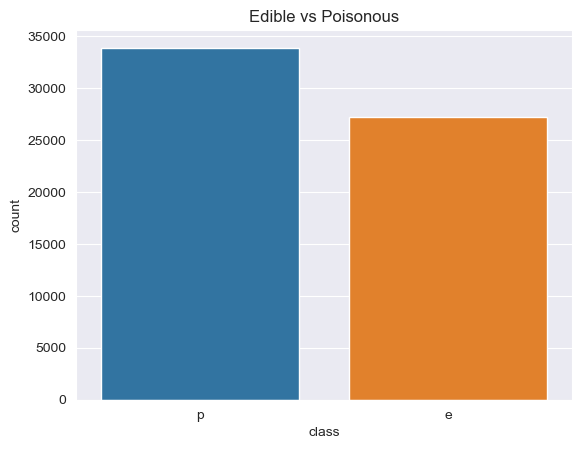

In [3]:
df = pd.read_csv('Dataset/secondary_data.csv', sep=";")

# Distribution of the class variable ( edible or poisonous ) using seaborn
sns.countplot(x='class', data=df)
plt.title('Edible vs Poisonous')
plt.show()

In [4]:
df.head()

,class,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,stem-height,...,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,spore-print-color,habitat,season
0,p,15.26,x,g,o,f,e,NaN,w,16.95,...,s,y,w,u,w,t,g,NaN,d,w
1,p,16.60,x,g,o,f,e,NaN,w,17.99,...,s,y,w,u,w,t,g,NaN,d,u
2,p,14.07,x,g,o,f,e,NaN,w,17.80,...,s,y,w,u,w,t,g,NaN,d,w
3,p,14.17,f,h,e,f,e,NaN,w,15.77,...,s,y,w,u,w,t,p,NaN,d,w
4,p,14.64,x,h,o,f,e,NaN,w,16.53,...,s,y,w,u,w,t,p,NaN,d,w


In [5]:
df.tail()

,class,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,stem-height,...,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,spore-print-color,habitat,season
61064,p,1.18,s,s,y,f,f,f,f,3.93,...,NaN,NaN,y,NaN,NaN,f,f,NaN,d,a
61065,p,1.27,f,s,y,f,f,f,f,3.18,...,NaN,NaN,y,NaN,NaN,f,f,NaN,d,a
61066,p,1.27,s,s,y,f,f,f,f,3.86,...,NaN,NaN,y,NaN,NaN,f,f,NaN,d,u
61067,p,1.24,f,s,y,f,f,f,f,3.56,...,NaN,NaN,y,NaN,NaN,f,f,NaN,d,u
61068,p,1.17,s,s,y,f,f,f,f,3.25,...,NaN,NaN,y,NaN,NaN,f,f,NaN,d,u


In [6]:
df.describe()

,cap-diameter,stem-height,stem-width
count,61069.000000,61069.000000,61069.000000
mean,6.733854,6.581538,12.149410
std,5.264845,3.370017,10.035955
min,0.380000,0.000000,0.000000
25%,3.480000,4.640000,5.210000
50%,5.860000,5.950000,10.190000
75%,8.540000,7.740000,16.570000
max,62.340000,33.920000,103.910000


# 1. Data Cleaning

## 1.1. Missing Values

In [7]:
# Checking for null values
df.isnull().sum()

class                       0
cap-diameter                0
cap-shape                   0
cap-surface             14120
cap-color                   0
does-bruise-or-bleed        0
gill-attachment          9884
gill-spacing            25063
gill-color                  0
stem-height                 0
stem-width                  0
stem-root               51538
stem-surface            38124
stem-color                  0
veil-type               57892
veil-color              53656
has-ring                    0
ring-type                2471
spore-print-color       54715
habitat                     0
season                      0
dtype: int64

In [8]:
# Percentage of null values
df.isnull().sum()/len(df)*100

class                    0.000000
cap-diameter             0.000000
cap-shape                0.000000
cap-surface             23.121387
cap-color                0.000000
does-bruise-or-bleed     0.000000
gill-attachment         16.184971
gill-spacing            41.040462
gill-color               0.000000
stem-height              0.000000
stem-width               0.000000
stem-root               84.393064
stem-surface            62.427746
stem-color               0.000000
veil-type               94.797688
veil-color              87.861272
has-ring                 0.000000
ring-type                4.046243
spore-print-color       89.595376
habitat                  0.000000
season                   0.000000
dtype: float64

### 1.1.1 Drop columns 

In [9]:
# Dropping columns with more than 20% null values
df.drop(['cap-surface', 'gill-spacing','stem-root', 'stem-surface', 'veil-type', 'veil-color', 'spore-print-color'], axis=1, inplace=True)

In [10]:
# Percentage of null values
df.isnull().sum()/len(df)*100

class                    0.000000
cap-diameter             0.000000
cap-shape                0.000000
cap-color                0.000000
does-bruise-or-bleed     0.000000
gill-attachment         16.184971
gill-color               0.000000
stem-height              0.000000
stem-width               0.000000
stem-color               0.000000
has-ring                 0.000000
ring-type                4.046243
habitat                  0.000000
season                   0.000000
dtype: float64

### 1.1.2 Checking Gill Attachment

In [11]:
# unique values in gill attachment
df['gill-attachment'].unique()

array(['e', nan, 'a', 'd', 's', 'x', 'p', 'f'], dtype=object)

In [12]:
# mode of gill-attachment
df['gill-attachment'].mode()

0    a
Name: gill-attachment, dtype: object

In [13]:
# remove null rows from gill-attachment
df = df.dropna(subset=['gill-attachment'])

In [14]:
# Percentage of null values
df.isnull().sum()/len(df)*100

class                   0.000000
cap-diameter            0.000000
cap-shape               0.000000
cap-color               0.000000
does-bruise-or-bleed    0.000000
gill-attachment         0.000000
gill-color              0.000000
stem-height             0.000000
stem-width              0.000000
stem-color              0.000000
has-ring                0.000000
ring-type               4.137931
habitat                 0.000000
season                  0.000000
dtype: float64

### 1.1.3 Checking ring-type

In [15]:
# unique values in ring-type
df['ring-type'].unique()

array(['g', 'p', 'e', 'l', 'f', nan, 'r', 'z'], dtype=object)

In [16]:
# mode of ring-type
df['ring-type'].mode()

0    f
Name: ring-type, dtype: object

In [17]:
# remove null rows from ring-type
df = df.dropna(subset=['ring-type'])

In [18]:
# Percentage of null values
df.isnull().sum()/len(df)*100

class                   0.0
cap-diameter            0.0
cap-shape               0.0
cap-color               0.0
does-bruise-or-bleed    0.0
gill-attachment         0.0
gill-color              0.0
stem-height             0.0
stem-width              0.0
stem-color              0.0
has-ring                0.0
ring-type               0.0
habitat                 0.0
season                  0.0
dtype: float64

In [19]:
# has-ring has (t and f) convert them to True and False
df['has-ring'] = df['has-ring'].map({'t': True, 'f': False})

## 1.2 Duplicates

In [20]:
# sum of duplicates variables
df.duplicated().sum()

117

In [21]:
# Dropping duplicate rows
df.drop_duplicates(inplace=True)

df.duplicated().sum()


0

## 1.3 Outliers

In [22]:
# Function to get Outliers
def get_outliers(dataf, column):
    q1 = dataf[column].quantile(0.25)
    q3 = dataf[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    return dataf[(dataf[column] < lower_bound) | (dataf[column] > upper_bound)]

def get_outlier_count(dataf, columns):
    result = []
    for column in columns:
        q1 = dataf[column].quantile(0.25)
        q3 = dataf[column].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        result.append(len(dataf[(dataf[column] < lower_bound) | (dataf[column] > upper_bound)]))
    return result

# Outliers in cap-diameter
cap_diameter_outliers = get_outliers(df, 'cap-diameter')

# Outliers in stem-height
stem_height_outliers = get_outliers(df, 'stem-height')

# Outliers in stem-width
stem_width_outliers = get_outliers(df, 'stem-width')

print(f"Cap Diameter Outliers: {len(cap_diameter_outliers)}\nStem Height Outliers: {len(stem_height_outliers)}\nStem Width Outliers: {len(stem_width_outliers)}")


Cap Diameter Outliers: 2120
Stem Height Outliers: 3383
Stem Width Outliers: 1946


In [23]:
# Dropping outliers
df = df[~df['cap-diameter'].isin(cap_diameter_outliers['cap-diameter'])]
df = df[~df['stem-height'].isin(stem_height_outliers['stem-height'])]
df = df[~df['stem-width'].isin(stem_width_outliers['stem-width'])]

# 2. Data Pre-Processing
## 2.1 Feature Engineering
### 2.1.1 Creating New Features

In [24]:
# Using '+' operator to concatenate columns
df['habitatXseason'] = df['habitat'] + df['season']
df['habitatXseason'].unique()

array(['da', 'du', 'ma', 'mu', 'gu', 'ha', 'ga', 'hu', 'lu', 'la', 'lw',
       'dw', 'gw', 'ds', 'ms', 'mw', 'gs', 'pu', 'pa', 'hs', 'wu', 'wa',
       'us', 'ua', 'uu', 'ls'], dtype=object)

In [25]:
# Count of unique values in habitatXseason count and count as a percentage
habitatXseason_count = df['habitatXseason'].value_counts()
habitatXseason_percentage = df['habitatXseason'].value_counts(normalize=True) * 100

# Custom dataframe for habitatXseason
habitatXseason = pd.DataFrame({'count': habitatXseason_count, 'percentage': habitatXseason_percentage})
habitatXseason

,count,percentage
habitatXseason,,
da,15429,35.486913
du,11325,26.047656
ga,2688,6.182437
gu,2483,5.710934
dw,2200,5.060030
la,1510,3.473021
ha,1102,2.534615
ma,1084,2.493215
ds,1004,2.309214


In [26]:
# remove habitat and season columns
df.drop(['habitat', 'season'], axis=1, inplace=True)

### 2.1.2 Feature Encoding

In [27]:
# Create dummy variables using one-hot encoding 
dummy_habitatXseason = pd.get_dummies(df['habitatXseason'])
dummy_class = pd.get_dummies(df['class'])

# Concatenate the dummy variables with the original DataFrame
df = pd.concat([df, dummy_habitatXseason, dummy_class], axis=1)

# Drop the original categorical columns
df.drop(['habitatXseason', 'class'], axis=1, inplace=True)

df

,cap-diameter,cap-shape,cap-color,does-bruise-or-bleed,gill-attachment,gill-color,stem-height,stem-width,stem-color,has-ring,...,mw,pa,pu,ua,us,uu,wa,wu,e,p
353,6.87,x,n,f,e,w,6.88,13.64,w,True,...,False,False,False,False,False,False,False,False,False,True
354,8.59,p,n,f,e,w,9.15,17.34,w,True,...,False,False,False,False,False,False,False,False,False,True
355,5.95,p,n,f,e,w,7.54,12.73,w,True,...,False,False,False,False,False,False,False,False,False,True
356,6.51,x,n,f,e,w,6.80,12.92,w,True,...,False,False,False,False,False,False,False,False,False,True
357,7.66,x,n,f,e,w,8.55,14.98,w,True,...,False,False,False,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61064,1.18,s,y,f,f,f,3.93,6.22,y,False,...,False,False,False,False,False,False,False,False,False,True
61065,1.27,f,y,f,f,f,3.18,5.43,y,False,...,False,False,False,False,False,False,False,False,False,True
61066,1.27,s,y,f,f,f,3.86,6.37,y,False,...,False,False,False,False,False,False,False,False,False,True
61067,1.24,f,y,f,f,f,3.56,5.44,y,False,...,False,False,False,False,False,False,False,False,False,True


In [28]:
# describe dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 43478 entries, 353 to 61068
Data columns (total 39 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   cap-diameter          43478 non-null  float64
 1   cap-shape             43478 non-null  object 
 2   cap-color             43478 non-null  object 
 3   does-bruise-or-bleed  43478 non-null  object 
 4   gill-attachment       43478 non-null  object 
 5   gill-color            43478 non-null  object 
 6   stem-height           43478 non-null  float64
 7   stem-width            43478 non-null  float64
 8   stem-color            43478 non-null  object 
 9   has-ring              43478 non-null  bool   
 10  ring-type             43478 non-null  object 
 11  da                    43478 non-null  bool   
 12  ds                    43478 non-null  bool   
 13  du                    43478 non-null  bool   
 14  dw                    43478 non-null  bool   
 15  ga                    

In [29]:
# Encode Variables
dummy_cap_shape = pd.get_dummies(df['cap-shape'], prefix='cap_shape')
dummy_cap_color = pd.get_dummies(df['cap-color'], prefix='cap_color')
dummy_does_bruise_or_bleed = pd.get_dummies(df['does-bruise-or-bleed'], prefix='bruise_or_bleed')
dummy_gill_attachment = pd.get_dummies(df['gill-attachment'], prefix='gill_attachment')
dummy_gill_color = pd.get_dummies(df['gill-color'], prefix='gill_color')
dummy_stem_color = pd.get_dummies(df['stem-color'], prefix='stem_color')
dummy_ring_type = pd.get_dummies(df['ring-type'], prefix='ring_type')

# Remove original variables
df.drop(['cap-shape', 'cap-color', 'does-bruise-or-bleed', 'gill-attachment', 'gill-color', 'stem-color', 'ring-type'], axis=1, inplace=True)

# Concatenate the dummy variables with the original DataFrame
df = pd.concat([df, dummy_cap_shape, dummy_cap_color, dummy_does_bruise_or_bleed, dummy_gill_attachment, dummy_gill_color, dummy_stem_color, dummy_ring_type], axis=1)

df


,cap-diameter,stem-height,stem-width,has-ring,da,ds,du,dw,ga,gs,...,stem_color_u,stem_color_w,stem_color_y,ring_type_e,ring_type_f,ring_type_g,ring_type_l,ring_type_p,ring_type_r,ring_type_z
353,6.87,6.88,13.64,True,True,False,False,False,False,False,...,False,True,False,False,False,False,False,True,False,False
354,8.59,9.15,17.34,True,True,False,False,False,False,False,...,False,True,False,False,False,False,False,True,False,False
355,5.95,7.54,12.73,True,False,False,True,False,False,False,...,False,True,False,False,False,False,False,True,False,False
356,6.51,6.80,12.92,True,True,False,False,False,False,False,...,False,True,False,False,False,False,False,True,False,False
357,7.66,8.55,14.98,True,True,False,False,False,False,False,...,False,True,False,False,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61064,1.18,3.93,6.22,False,True,False,False,False,False,False,...,False,False,True,False,True,False,False,False,False,False
61065,1.27,3.18,5.43,False,True,False,False,False,False,False,...,False,False,True,False,True,False,False,False,False,False
61066,1.27,3.86,6.37,False,False,False,True,False,False,False,...,False,False,True,False,True,False,False,False,False,False
61067,1.24,3.56,5.44,False,False,False,True,False,False,False,...,False,False,True,False,True,False,False,False,False,False


In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 43478 entries, 353 to 61068
Data columns (total 91 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   cap-diameter       43478 non-null  float64
 1   stem-height        43478 non-null  float64
 2   stem-width         43478 non-null  float64
 3   has-ring           43478 non-null  bool   
 4   da                 43478 non-null  bool   
 5   ds                 43478 non-null  bool   
 6   du                 43478 non-null  bool   
 7   dw                 43478 non-null  bool   
 8   ga                 43478 non-null  bool   
 9   gs                 43478 non-null  bool   
 10  gu                 43478 non-null  bool   
 11  gw                 43478 non-null  bool   
 12  ha                 43478 non-null  bool   
 13  hs                 43478 non-null  bool   
 14  hu                 43478 non-null  bool   
 15  la                 43478 non-null  bool   
 16  ls                 43478 

In [31]:
# save to file
df.to_csv('Dataset/encoded_processed_data.csv', index=False)

### 2.1.3 Feature Scaling

In [32]:
# check the entropy of the stem-width, stem-height, and cap-diameter and compare the results
from scipy.stats import entropy

# Entropy of stem-width
stem_width_entropy = entropy(df['stem-width'].value_counts(normalize=True), base=2)
print(stem_width_entropy)

# Entropy of stem-height
stem_height_entropy = entropy(df['stem-height'].value_counts(normalize=True), base=2)
print(stem_height_entropy)

# Entropy of cap-diameter
cap_diameter_entropy = entropy(df['cap-diameter'].value_counts(normalize=True), base=2)
print(cap_diameter_entropy)

# Check means of the variables
print(df[['stem-width', 'stem-height', 'cap-diameter']].mean())

# Check the standard deviation of the variables
print(df[['stem-width', 'stem-height', 'cap-diameter']].std())



11.21303146035882
9.575626585200355
10.225350247862728
stem-width      11.043123
stem-height      5.953912
cap-diameter     6.049256
dtype: float64
stem-width      7.307599
stem-height     1.962676
cap-diameter    3.224465
dtype: float64


In [33]:
# Standardize the variables and create a new DataFrame

standadized_df = df.copy()

standadized_df['stem-width'] = (standadized_df['stem-width'] -
                                standadized_df['stem-width'].mean()) / standadized_df['stem-width'].std()
standadized_df['stem-height'] = (standadized_df['stem-height'] -
                                 standadized_df['stem-height'].mean()) / standadized_df['stem-height'].std()
standadized_df['cap-diameter'] = (standadized_df['cap-diameter'] -
                                  standadized_df['cap-diameter'].mean()) / standadized_df['cap-diameter'].std()

# Check the means of the standardized variables
print(standadized_df[['stem-width', 'stem-height', 'cap-diameter']].mean())

# Check the standard deviation of the standardized variables
print(standadized_df[['stem-width', 'stem-height', 'cap-diameter']].std())

stem-width      6.275551e-17
stem-height     2.091850e-17
cap-diameter   -1.333555e-16
dtype: float64
stem-width      1.0
stem-height     1.0
cap-diameter    1.0
dtype: float64


In [34]:
# save to file
standadized_df.to_csv(
    'Dataset/standardized_encoded_processed_data.csv', index=False)

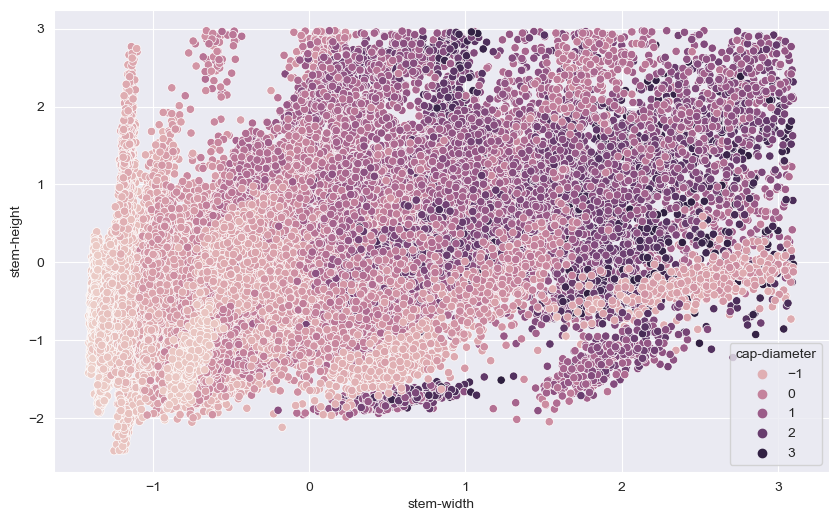

In [35]:
# Scatter plot of stem-width and stem-height with cap-diameter as the hue
plt.figure(figsize=(10, 6))
sns.scatterplot(data=standadized_df, x='stem-width',
                y='stem-height', hue='cap-diameter')
plt.show()

In [36]:
from sklearn.preprocessing import MinMaxScaler
# Scale the dataset and create a new DataFrame
# Create a new DataFrame without the StandardScaler
scaled_df = df.copy()

# Scale the numerical columns using MinMaxScaler
scaler = MinMaxScaler()
scaled_df[['cap-diameter', 'stem-height', 'stem-width']] = scaler.fit_transform(df[['cap-diameter', 'stem-height', 'stem-width']])


In [37]:
scaled_df

,cap-diameter,stem-height,stem-width,has-ring,da,ds,du,dw,ga,gs,...,stem_color_u,stem_color_w,stem_color_y,ring_type_e,ring_type_f,ring_type_g,ring_type_l,ring_type_p,ring_type_r,ring_type_z
353,0.410863,0.536355,0.391621,True,True,False,False,False,False,False,...,False,True,False,False,False,False,False,True,False,False
354,0.520767,0.750708,0.503947,True,True,False,False,False,False,False,...,False,True,False,False,False,False,False,True,False,False
355,0.352077,0.598678,0.363995,True,False,False,True,False,False,False,...,False,True,False,False,False,False,False,True,False,False
356,0.387859,0.528801,0.369763,True,True,False,False,False,False,False,...,False,True,False,False,False,False,False,True,False,False
357,0.461342,0.694051,0.432301,True,True,False,False,False,False,False,...,False,True,False,False,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61064,0.047284,0.257790,0.166363,False,True,False,False,False,False,False,...,False,False,True,False,True,False,False,False,False,False
61065,0.053035,0.186969,0.142380,False,True,False,False,False,False,False,...,False,False,True,False,True,False,False,False,False,False
61066,0.053035,0.251180,0.170917,False,False,False,True,False,False,False,...,False,False,True,False,True,False,False,False,False,False
61067,0.051118,0.222852,0.142684,False,False,False,True,False,False,False,...,False,False,True,False,True,False,False,False,False,False


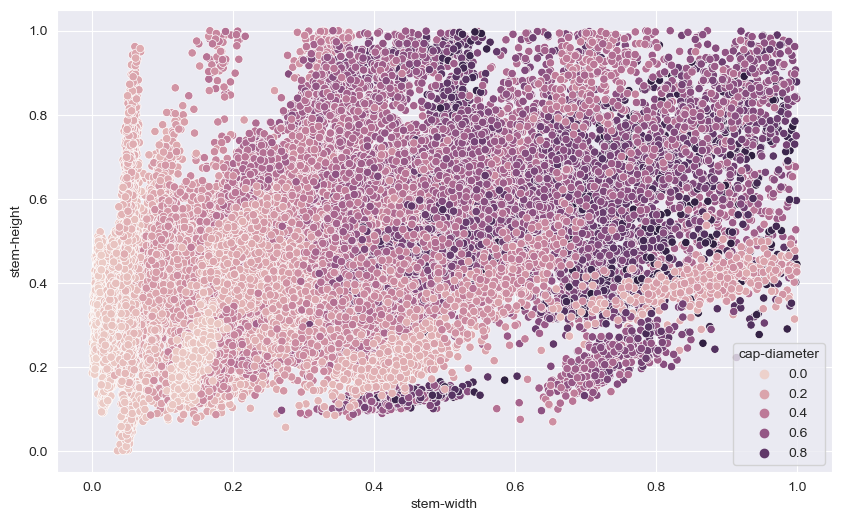

In [38]:
# Scatter plot of stem-width and stem-height with cap-diameter as the hue

plt.figure(figsize=(10, 6))
sns.scatterplot(data=scaled_df, x='stem-width', y='stem-height', hue='cap-diameter')
plt.show()

# save to file
scaled_df.to_csv('Dataset/scaled_encoded_processed_data.csv', index=False)

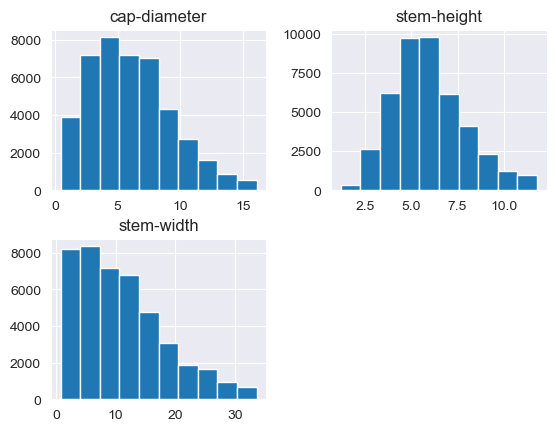

In [39]:
df.hist()
plt.show()

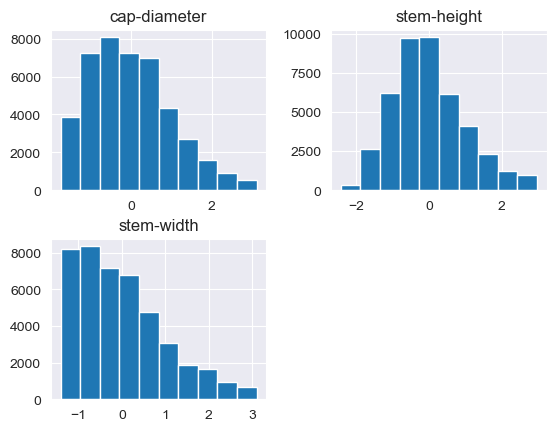

In [40]:
standadized_df.hist()
plt.show()

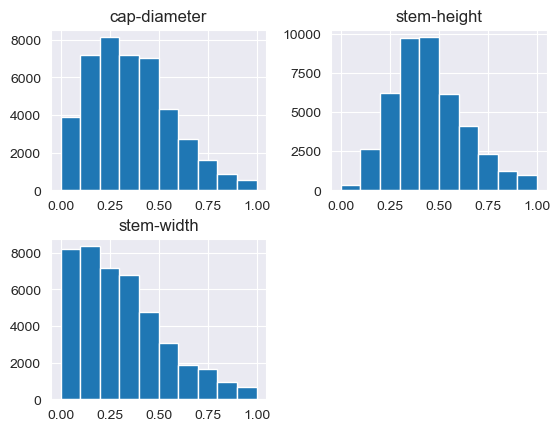

In [41]:
scaled_df.hist()
plt.show()

### 2.1.4 Binning or Discretization

In [42]:
# Binning the scaled cap-diameter, stem-height, and stem-width columns and create a new DataFrame

binned_scaled_df = scaled_df.copy()

# Bin the cap-diameter column
binned_scaled_df['cap-diameter'] = pd.cut(binned_scaled_df['cap-diameter'], bins=3, labels=['small', 'medium', 'large'])

# Bin the stem-height column
binned_scaled_df['stem-height'] = pd.cut(binned_scaled_df['stem-height'], bins=3, labels=['short', 'medium', 'tall'])

# Bin the stem-width column
binned_scaled_df['stem-width'] = pd.cut(binned_scaled_df['stem-width'], bins=3, labels=['thin', 'medium', 'thick'])

# One hot encoding the binned columns and create a new DataFrame

dummy_cap_diameter = pd.get_dummies(binned_scaled_df['cap-diameter'], prefix='cap_diameter')
dummy_stem_height = pd.get_dummies(binned_scaled_df['stem-height'], prefix='stem_height')
dummy_stem_width = pd.get_dummies(binned_scaled_df['stem-width'], prefix='stem_width')

# Remove original columns
binned_scaled_df.drop(['cap-diameter', 'stem-height', 'stem-width'], axis=1, inplace=True)

# Concatenate the dummy variables with the original DataFrame
binned_scaled_df = pd.concat([binned_scaled_df, dummy_cap_diameter, dummy_stem_height, dummy_stem_width], axis=1)

# save to file
binned_scaled_df.to_csv('Dataset/binned_scaled_encoded_processed_data.csv', index=False)

In [43]:
# Binning the Standardized cap-diameter, stem-height, and stem-width columns and create a new DataFrame

binned_standardized_df = standadized_df.copy()

# Bin the cap-diameter column
binned_standardized_df['cap-diameter'] = pd.cut(binned_standardized_df['cap-diameter'], bins=3, labels=['small', 'medium', 'large'])

# Bin the stem-height column
binned_standardized_df['stem-height'] = pd.cut(binned_standardized_df['stem-height'], bins=3, labels=['short', 'medium', 'tall'])

# Bin the stem-width column
binned_standardized_df['stem-width'] = pd.cut(binned_standardized_df['stem-width'], bins=3, labels=['thin', 'medium', 'thick'])

# One hot encoding the binned columns and create a new DataFrame

dummy_cap_diameter = pd.get_dummies(binned_standardized_df['cap-diameter'], prefix='cap_diameter')
dummy_stem_height = pd.get_dummies(binned_standardized_df['stem-height'], prefix='stem_height')
dummy_stem_width = pd.get_dummies(binned_standardized_df['stem-width'], prefix='stem_width')

# Remove original columns
binned_standardized_df.drop(['cap-diameter', 'stem-height', 'stem-width'], axis=1, inplace=True)

# Concatenate the dummy variables with the original DataFrame
binned_standardized_df = pd.concat([binned_standardized_df, dummy_cap_diameter, dummy_stem_height, dummy_stem_width], axis=1)

# save to file
binned_standardized_df.to_csv('Dataset/binned_standardized_encoded_processed_data.csv', index=False)

### 2.1.5 Data Transformation

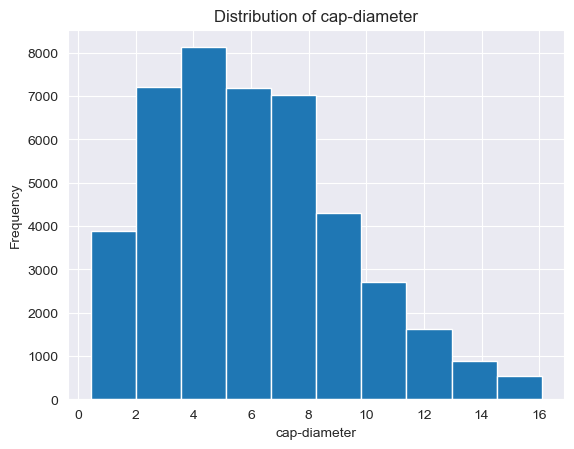

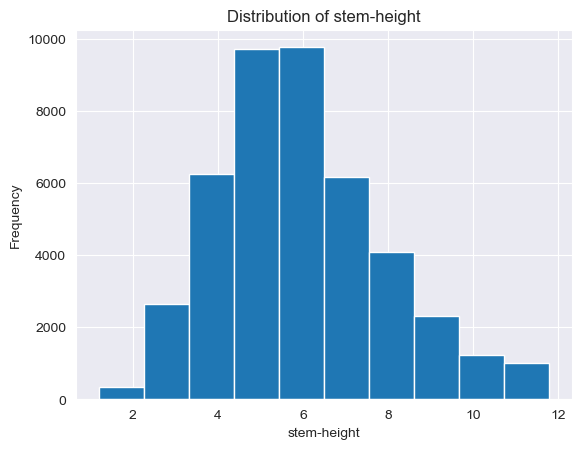

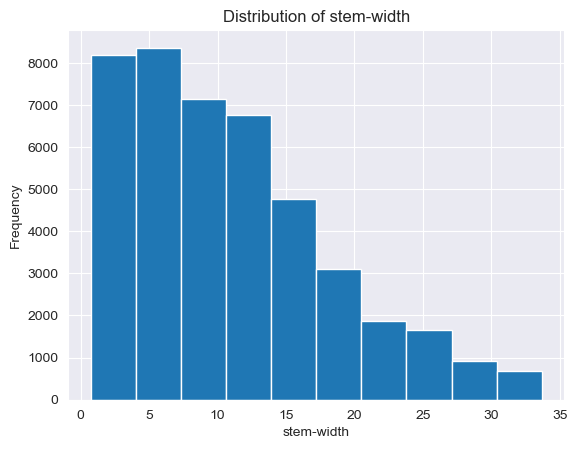

In [44]:
import matplotlib.pyplot as plt

# Plot histograms for numerical variables
numerical_vars = ['cap-diameter', 'stem-height', 'stem-width']
for var in numerical_vars:
    plt.hist(df[var])
    plt.xlabel(var)
    plt.ylabel('Frequency')
    plt.title(f'Distribution of {var}')
    plt.show()

Considering the above charts we will not need any data transformations for this dataset.

# 2.2 Data Splitting

In [45]:
df.head()

,cap-diameter,stem-height,stem-width,has-ring,da,ds,du,dw,ga,gs,...,stem_color_u,stem_color_w,stem_color_y,ring_type_e,ring_type_f,ring_type_g,ring_type_l,ring_type_p,ring_type_r,ring_type_z
353,6.87,6.88,13.64,True,True,False,False,False,False,False,...,False,True,False,False,False,False,False,True,False,False
354,8.59,9.15,17.34,True,True,False,False,False,False,False,...,False,True,False,False,False,False,False,True,False,False
355,5.95,7.54,12.73,True,False,False,True,False,False,False,...,False,True,False,False,False,False,False,True,False,False
356,6.51,6.80,12.92,True,True,False,False,False,False,False,...,False,True,False,False,False,False,False,True,False,False
357,7.66,8.55,14.98,True,True,False,False,False,False,False,...,False,True,False,False,False,False,False,True,False,False


## 2.2.1 Splitting and Sampling

In [46]:
from sklearn.model_selection import train_test_split

# Create a single target column from the 'e' and 'p' columns
df['target'] = df['e']  # Here 'e' is 1 for edible and 0 otherwise; this assumes 'p' would be 1 for poisonous.

# Now, 'target' is your new target variable where 1 represents 'edible' and 0 would inherently represent 'poisonous'

# Drop the original 'e' and 'p' columns to avoid using them as features accidentally
X = df.drop(['e', 'p', 'target'], axis=1)  # Drop the original target columns and the new target column for feature matrix
y = df['target']  # Use the newly created target column for the target variable

# Proceed with the train-test split as previously outlined
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# If needed, create a validation set
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=42, stratify=y_train)


In [47]:
# Create a single target column from the 'e' and 'p' columns
scaled_df['target'] = scaled_df['e']  # Here 'e' is 1 for edible and 0 otherwise; this assumes 'p' would be 1 for poisonous.

# Now, 'target' is your new target variable where 1 represents 'edible' and 0 would inherently represent 'poisonous'

# Drop the original 'e' and 'p' columns to avoid using them as features accidentally
scaled_X = scaled_df.drop(['e', 'p', 'target'], axis=1)  # Drop the original target columns and the new target column for feature matrix
scaled_y = scaled_df['target']  # Use the newly created target column for the target variable

# Proceed with the train-test split as previously outlined
scaled_X_train, scaled_X_test, scaled_y_train, scaled_y_test = train_test_split(scaled_X, scaled_y, test_size=0.2, random_state=42, stratify=scaled_y)

# If needed, create a validation set
scaled_X_train, scaled_X_val, scaled_y_train, scaled_y_val = train_test_split(scaled_X_train, scaled_y_train, test_size=0.25, random_state=42, stratify=scaled_y_train)


In [48]:
# Create a single target column from the 'e' and 'p' columns
standadized_df['target'] = standadized_df['e']  # Here 'e' is 1 for edible and 0 otherwise; this assumes 'p' would be 1 for poisonous.

# Now, 'target' is your new target variable where 1 represents 'edible' and 0 would inherently represent 'poisonous'

# Drop the original 'e' and 'p' columns to avoid using them as features accidentally
standadized_X = standadized_df.drop(['e', 'p', 'target'], axis=1)  # Drop the original target columns and the new target column for feature matrix
standadized_y = standadized_df['target']  # Use the newly created target column for the target variable

# Proceed with the train-test split as previously outlined
standardized_X_train, standardized_X_test, standardized_y_train, standardized_y_test = train_test_split(standadized_X, standadized_y, test_size=0.2, random_state=42, stratify=standadized_y)

# If needed, create a validation set
standardized_X_train, standardized_X_val, standardized_y_train, standardized_y_val = train_test_split(standardized_X_train, standardized_y_train, test_size=0.25, random_state=42, stratify=standardized_y_train)


In [49]:
# Assuming 'df' is your DataFrame after all preprocessing steps

# Create a single target column from the 'e' and 'p' columns
binned_scaled_df['target'] = binned_scaled_df['e']  # Here 'e' is 1 for edible and 0 otherwise; this assumes 'p' would be 1 for poisonous.

# Now, 'target' is your new target variable where 1 represents 'edible' and 0 would inherently represent 'poisonous'

# Drop the original 'e' and 'p' columns to avoid using them as features accidentally
binned_scaled_X = binned_scaled_df.drop(['e', 'p', 'target'], axis=1)  # Drop the original target columns and the new target column for feature matrix
binned_scaled_y = binned_scaled_df['target']  # Use the newly created target column for the target variable

# Proceed with the train-test split as previously outlined
binned_scaled_X_train, binned_scaled_X_test, binned_scaled_y_train, binned_scaled_y_test = train_test_split(binned_scaled_X, binned_scaled_y, test_size=0.2, random_state=42, stratify=binned_scaled_y)

# If needed, create a validation set
binned_scaled_X_train, binned_scaled_X_val, binned_scaled_y_train, binned_scaled_y_val = train_test_split(binned_scaled_X_train, binned_scaled_y_train, test_size=0.25, random_state=42, stratify=binned_scaled_y_train)


In [50]:
# Create a single target column from the 'e' and 'p' columns
binned_standardized_df['target'] = binned_standardized_df['e']  # Here 'e' is 1 for edible and 0 otherwise; this assumes 'p' would be 1 for poisonous.

# Now, 'target' is your new target variable where 1 represents 'edible' and 0 would inherently represent 'poisonous'

# Drop the original 'e' and 'p' columns to avoid using them as features accidentally
binned_standardized_X = binned_standardized_df.drop(['e', 'p', 'target'], axis=1)  # Drop the original target columns and the new target column for feature matrix
binned_standardized_y = binned_standardized_df['target']  # Use the newly created target column for the target variable

# Proceed with the train-test split as previously outlined
binned_standardized_X_train, binned_standardized_X_test, binned_standardized_y_train, binned_standardized_y_test = train_test_split(binned_standardized_X, binned_standardized_y, test_size=0.2, random_state=42, stratify=binned_standardized_y)

# If needed, create a validation set
binned_standardized_X_train, binned_standardized_X_val, binned_standardized_y_train, binned_standardized_y_val = train_test_split(binned_standardized_X_train, binned_standardized_y_train, test_size=0.25, random_state=42, stratify=binned_standardized_y_train)


## 2.2.2 Cross Validation

In [51]:
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(n_estimators=100, random_state=42)
cv = StratifiedKFold(n_splits=5)

# Assuming X and y are your features and target variable
scores = cross_val_score(model, X, y, cv=cv, scoring='accuracy')

print("Accuracy scores for each fold:", scores)


Accuracy scores for each fold: [0.51609936 0.50275989 0.46676633 0.47038528 0.59263945]


In [52]:
# Assuming X and y are your features and target variable
scores = cross_val_score(model, scaled_X, scaled_y, cv=cv, scoring='accuracy')

print("Accuracy scores for each fold:", scores)


Accuracy scores for each fold: [0.51621435 0.50264489 0.46665133 0.47038528 0.59240943]


In [53]:
# Assuming X and y are your features and target variable
scores = cross_val_score(model, standadized_X, standadized_y, cv=cv, scoring='accuracy')

print("Accuracy scores for each fold:", scores)


Accuracy scores for each fold: [0.51621435 0.50264489 0.46688132 0.47050029 0.59252444]


In [54]:
# Assuming X and y are your features and target variable
scores = cross_val_score(model, binned_scaled_X, binned_scaled_y, cv=cv, scoring='accuracy')

print("Accuracy scores for each fold:", scores)


Accuracy scores for each fold: [0.50229991 0.49425023 0.53599356 0.44726855 0.5840138 ]


In [55]:
# Assuming X and y are your features and target variable
scores = cross_val_score(model, binned_standardized_X, binned_standardized_y, cv=cv, scoring='accuracy')

print("Accuracy scores for each fold:", scores)


Accuracy scores for each fold: [0.49862006 0.49597516 0.55646274 0.45577918 0.59539965]


## Choice

By comparing all the above versions of the dataset the normal encoded dataset has the most accuracy for the folds. We are continuing with it.

# 3 Analysis

## 3.1 Descriptive Statistics

In [56]:
df.describe()

,cap-diameter,stem-height,stem-width
count,43478.000000,43478.000000,43478.000000
mean,6.049256,5.953912,11.043123
std,3.224465,1.962676,7.307599
min,0.440000,1.200000,0.740000
25%,3.530000,4.570000,5.470000
50%,5.740000,5.730000,9.750000
75%,8.050000,7.090000,15.370000
max,16.090000,11.790000,33.680000


In [57]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 43478 entries, 353 to 61068
Data columns (total 92 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   cap-diameter       43478 non-null  float64
 1   stem-height        43478 non-null  float64
 2   stem-width         43478 non-null  float64
 3   has-ring           43478 non-null  bool   
 4   da                 43478 non-null  bool   
 5   ds                 43478 non-null  bool   
 6   du                 43478 non-null  bool   
 7   dw                 43478 non-null  bool   
 8   ga                 43478 non-null  bool   
 9   gs                 43478 non-null  bool   
 10  gu                 43478 non-null  bool   
 11  gw                 43478 non-null  bool   
 12  ha                 43478 non-null  bool   
 13  hs                 43478 non-null  bool   
 14  hu                 43478 non-null  bool   
 15  la                 43478 non-null  bool   
 16  ls                 43478 

## 3.2 Data Visualization

### 3.2.1 Numerical Feature Distributions Across Edibility Classes

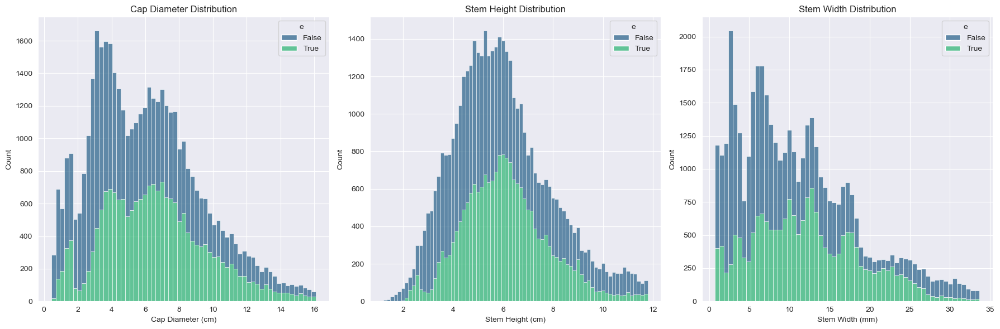

In [58]:
# Set up the matplotlib figure
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Plotting distributions of numerical features by edibility
sns.histplot(data=df, x="cap-diameter", hue="e", multiple="stack", ax=axes[0], palette="viridis")
axes[0].set_title('Cap Diameter Distribution')
axes[0].set_xlabel('Cap Diameter (cm)')
axes[0].set_ylabel('Count')

sns.histplot(data=df, x="stem-height", hue="e", multiple="stack", ax=axes[1], palette="viridis")
axes[1].set_title('Stem Height Distribution')
axes[1].set_xlabel('Stem Height (cm)')
axes[1].set_ylabel('Count')

sns.histplot(data=df, x="stem-width", hue="e", multiple="stack", ax=axes[2], palette="viridis")
axes[2].set_title('Stem Width Distribution')
axes[2].set_xlabel('Stem Width (mm)')
axes[2].set_ylabel('Count')

plt.tight_layout()
plt.show()

### 3.2.2 explore boxplots for numerical features to assess the spread and identify any outliers

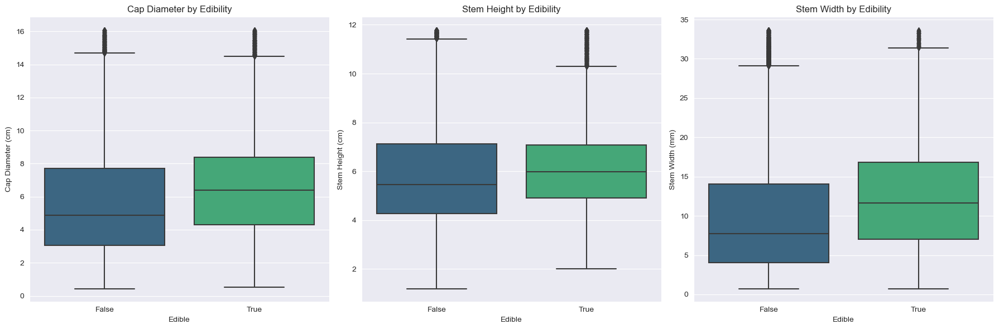

In [59]:
# Set up the matplotlib figure for boxplots
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Plotting boxplots of numerical features by edibility
sns.boxplot(data=df, x="e", y="cap-diameter", ax=axes[0], palette="viridis")
axes[0].set_title('Cap Diameter by Edibility')
axes[0].set_xlabel('Edible')
axes[0].set_ylabel('Cap Diameter (cm)')

sns.boxplot(data=df, x="e", y="stem-height", ax=axes[1], palette="viridis")
axes[1].set_title('Stem Height by Edibility')
axes[1].set_xlabel('Edible')
axes[1].set_ylabel('Stem Height (cm)')

sns.boxplot(data=df, x="e", y="stem-width", ax=axes[2], palette="viridis")
axes[2].set_title('Stem Width by Edibility')
axes[2].set_xlabel('Edible')
axes[2].set_ylabel('Stem Width (mm)')

plt.tight_layout()
plt.show()


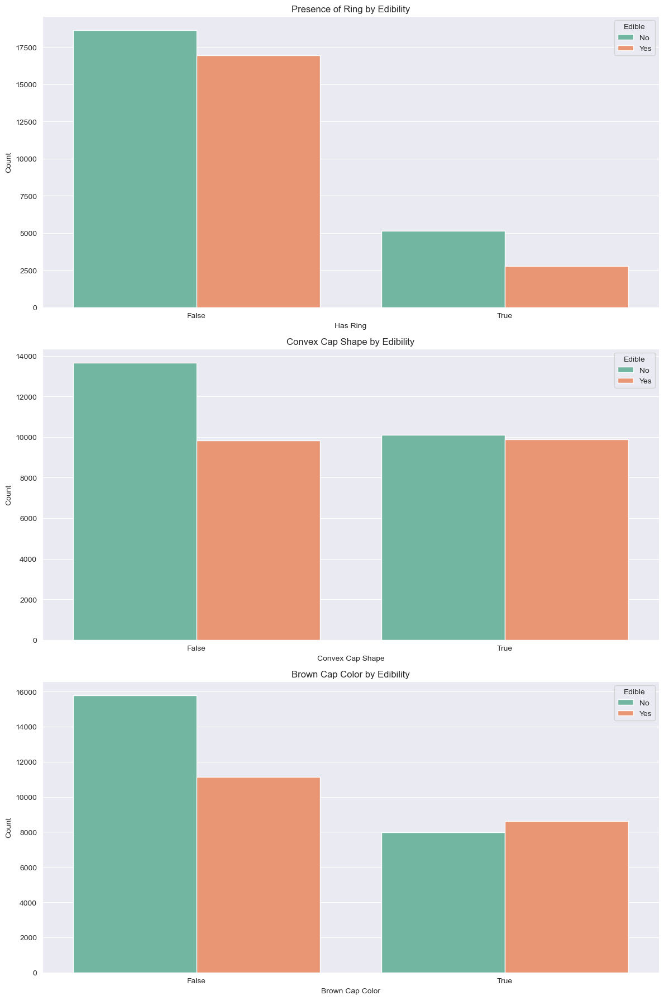

In [60]:
# Set up the matplotlib figure for countplots of categorical features
fig, axes = plt.subplots(3, 1, figsize=(12, 18))

# Plotting countplots of categorical features by edibility
# Since the original variables were encoded, we select a representative feature for visualization
sns.countplot(data=df, x="has-ring", hue="e", ax=axes[0], palette="Set2")
axes[0].set_title('Presence of Ring by Edibility')
axes[0].set_xlabel('Has Ring')
axes[0].set_ylabel('Count')
axes[0].legend(title='Edible', labels=['No', 'Yes'])

sns.countplot(data=df, x="cap_shape_x", hue="e", ax=axes[1], palette="Set2")
axes[1].set_title('Convex Cap Shape by Edibility')
axes[1].set_xlabel('Convex Cap Shape')
axes[1].set_ylabel('Count')
axes[1].legend(title='Edible', labels=['No', 'Yes'])

sns.countplot(data=df, x="cap_color_n", hue="e", ax=axes[2], palette="Set2")
axes[2].set_title('Brown Cap Color by Edibility')
axes[2].set_xlabel('Brown Cap Color')
axes[2].set_ylabel('Count')
axes[2].legend(title='Edible', labels=['No', 'Yes'])

plt.tight_layout()
plt.show()


### 3.2.3 Numerical Feature Distributions Across Edibility Classes for Each Season

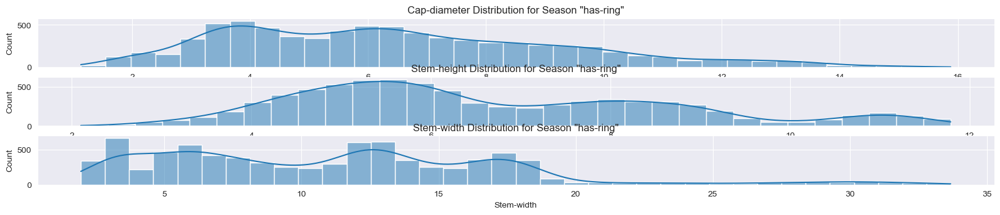

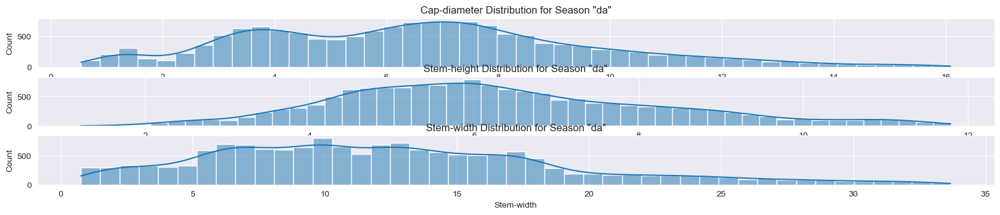

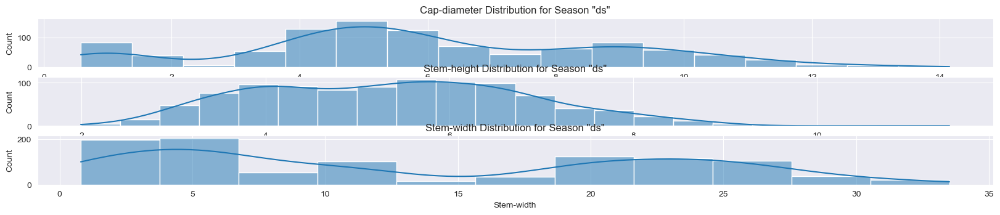

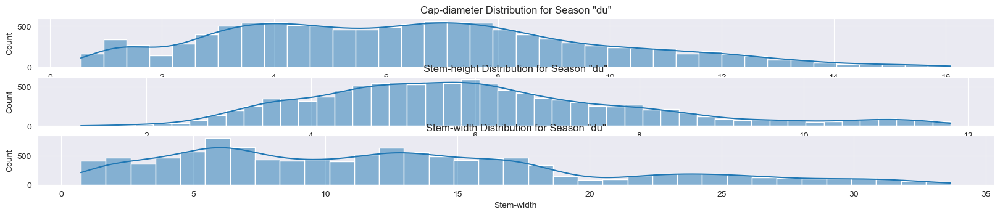

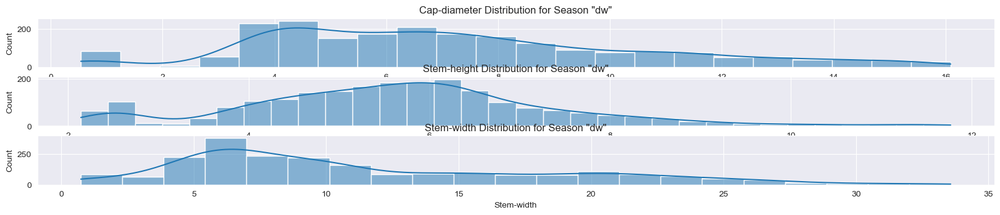

...

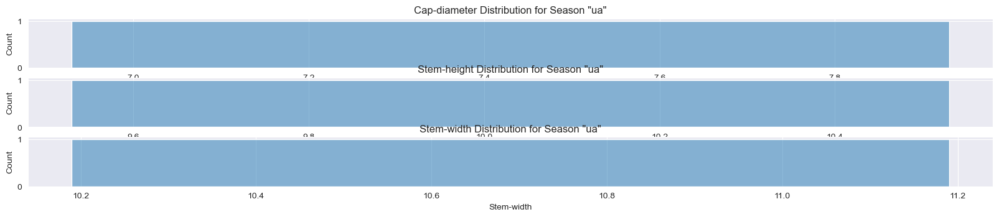

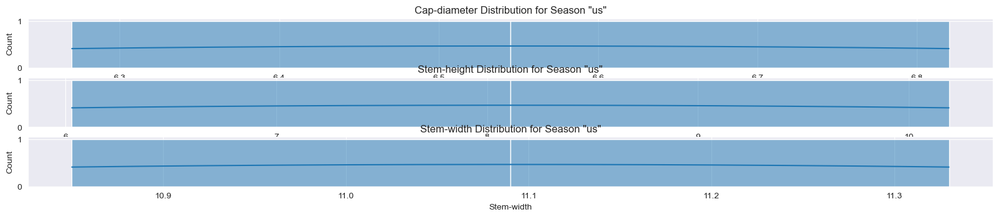

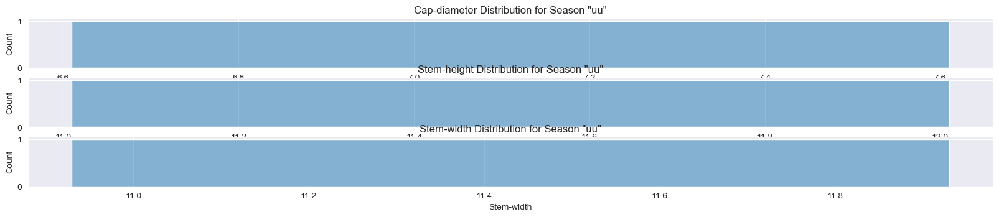

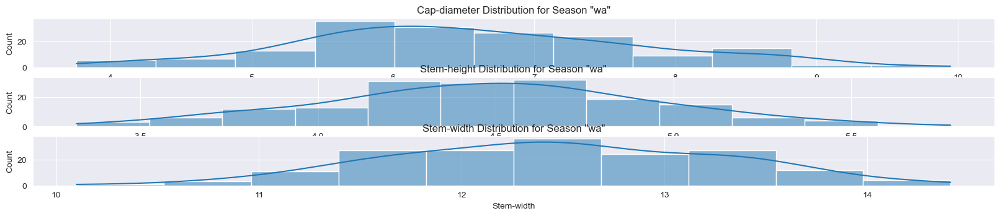

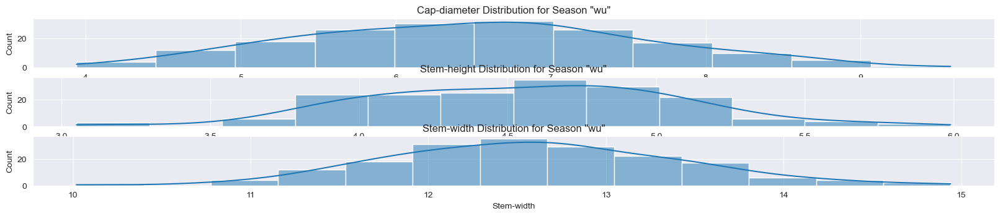

In [61]:
# Correcting and executing the visualization for numerical feature distributions across different seasons
# based on the provided approach, adjusting for the identified season columns.

# Identifying the season columns based on the prefixes provided
season_columns = [col for col in df.columns if col.startswith(('da', 'du', 'ga', 'gu', 'dw', 'la', 'ha', 'ma', 'ds', 'mu', 'lu', 'hu', 'lw', 'gw', 'mw', 'ms', 'pa', 'wu', 'wa', 'ls', 'pu', 'gs', 'hs', 'us', 'ua', 'uu'))]

# Numerical features to visualize
numerical_features = ['cap-diameter', 'stem-height', 'stem-width']

# Setting up the visualization with a large enough figure size

# Counter for subplot indexing
counter = 1

# Number of rows for subplots based on the features and seasons
num_rows = len(season_columns) * len(numerical_features)

for season in season_columns:
    plt.figure(figsize=(20, 100))
    for feature in numerical_features:
        plt.subplot(num_rows, 1, counter)
        sns.histplot(data=df[df[season] == 1], x=feature, kde=True)
        plt.title(f'{feature.capitalize()} Distribution for Season "{season}"')
        plt.xlabel(f'{feature.capitalize()}')
        plt.ylabel('Count')
        counter += 1
    #plt.tight_layout()
    plt.show()


### 3.2.4 Explore boxplots for numerical features to assess the spread and identify any outliers

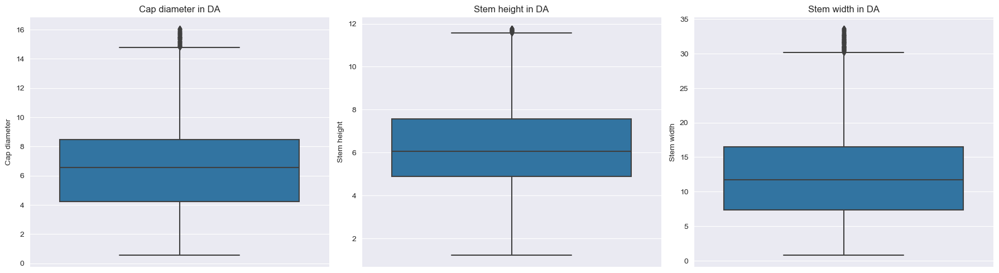

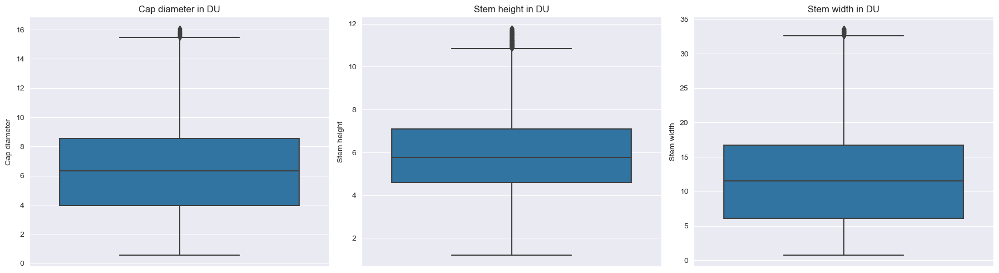

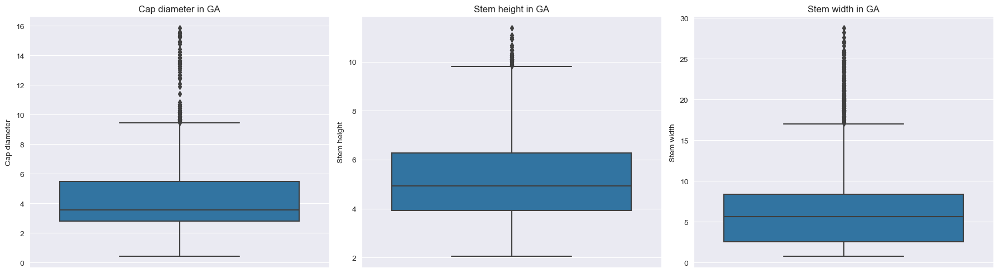

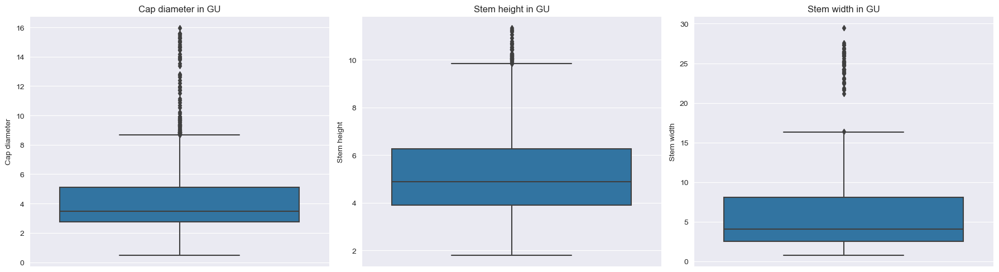

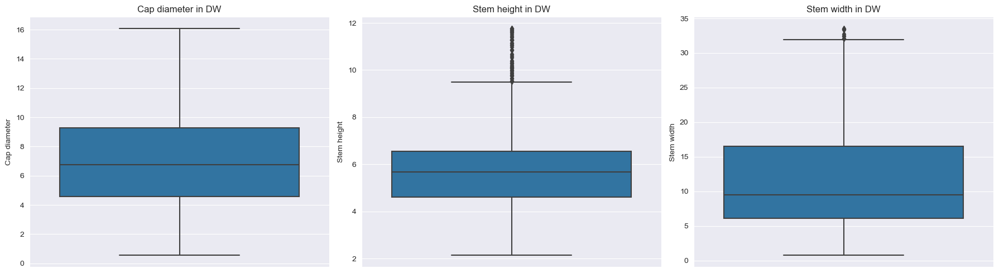

...

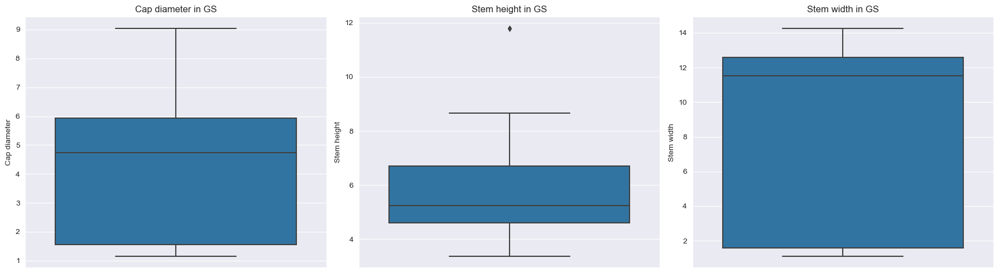

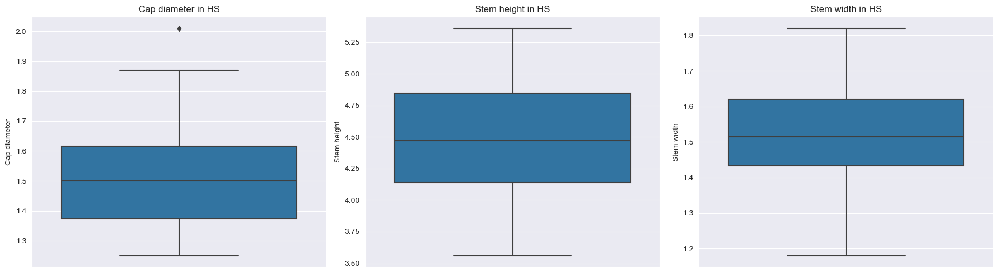

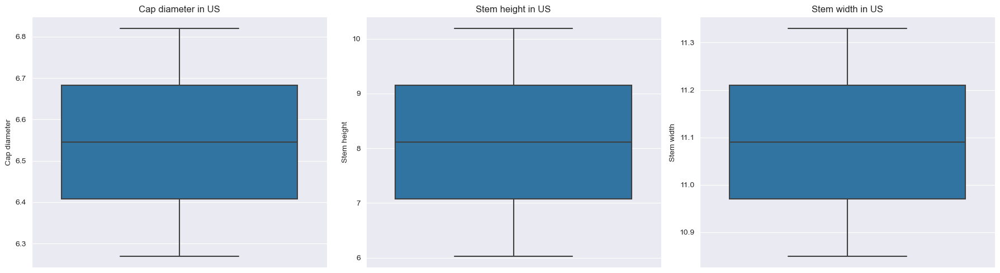

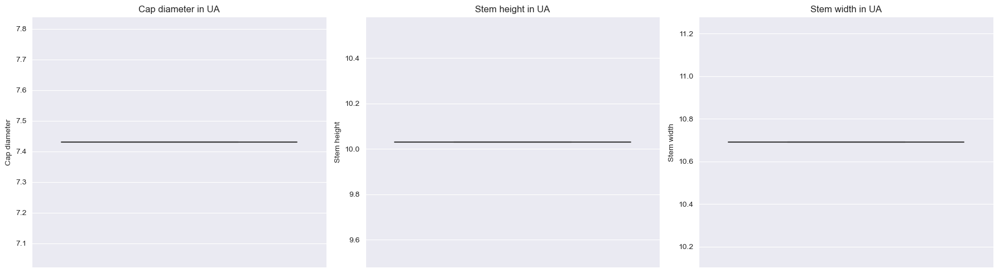

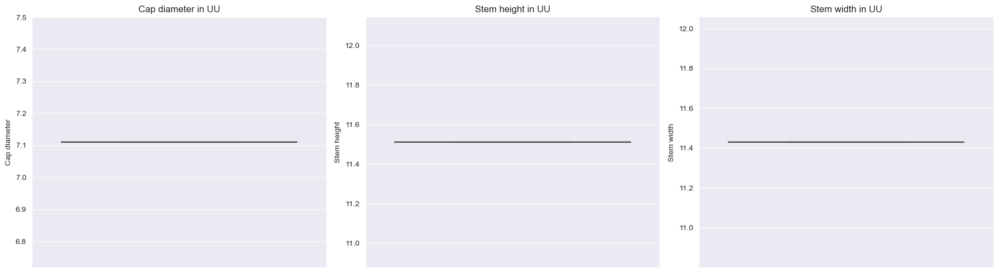

In [62]:
# da,ds,du,dw,ga,gs,gu,gw,ha,hs,hu,la,ls,lu,lw,ma,ms,mu,mw,pa,pu,ua,us,uu,wa,wu
seasons = ['da', 'du', 'ga', 'gu', 'dw', 'la', 'ha', 'ma', 'ds', 'mu', 'lu', 'hu', 'lw', 'gw', 'mw', 'ms', 'pa', 'wu', 'wa', 'ls', 'pu', 'gs', 'hs', 'us', 'ua', 'uu']

# List of numerical features to visualize
numerical_features = ['cap-diameter', 'stem-height', 'stem-width']

# Iterate over each season to create boxplots for each numerical feature
for season in seasons:
    plt.figure(figsize=(18, 5))
    for i, feature in enumerate(numerical_features):
        plt.subplot(1, len(numerical_features), i+1)
        sns.boxplot(data=df[df[season] == 1], y=feature)
        plt.title(f'{feature.replace("-", " ").capitalize()} in {season.upper()}')
        plt.ylabel(f'{feature.replace("-", " ").capitalize()}')
    plt.tight_layout()
    plt.show()


In [63]:
# da,ds,du,dw,ga,gs,gu,gw,ha,hs,hu,la,ls,lu,lw,ma,ms,mu,mw,pa,pu,ua,us,uu,wa,wu
seasons = ['da', 'du', 'ga', 'gu', 'dw', 'la', 'ha', 'ma', 'ds', 'mu', 'lu', 'hu', 'lw', 'gw', 'mw', 'ms', 'pa', 'wu', 'wa', 'ls', 'pu', 'gs', 'hs', 'us', 'ua', 'uu']

# List of numerical features to visualize
numerical_features = ['cap-diameter', 'stem-height', 'stem-width']

# Iterate over each season to create sub datasets and get their descriptive statistics
for season in seasons:
    sub_df = df[df[season] == 1]
    print(f"Descriptive Statistics for Season {season.upper()}")
    print(sub_df[numerical_features].describe())
    print("\n")
    

Descriptive Statistics for Season DA
       cap-diameter   stem-height    stem-width
count  15429.000000  15429.000000  15429.000000
mean       6.634795      6.319758     12.432758
std        3.064445      1.978734      6.763310
min        0.540000      1.220000      0.770000
25%        4.220000      4.900000      7.330000
50%        6.540000      6.060000     11.710000
75%        8.450000      7.570000     16.460000
max       16.090000     11.790000     33.680000


Descriptive Statistics for Season DU
       cap-diameter   stem-height    stem-width
count  11325.000000  11325.000000  11325.000000
mean       6.489454      6.005928     12.306357
std        3.242954      1.986915      7.667061
min        0.550000      1.200000      0.740000
25%        3.960000      4.600000      6.090000
50%        6.310000      5.760000     11.550000
75%        8.560000      7.100000     16.680000
max       16.090000     11.790000     33.670000


Descriptive Statistics for Season GA
       cap-diameter  

## 3.3 Correlation Analysis

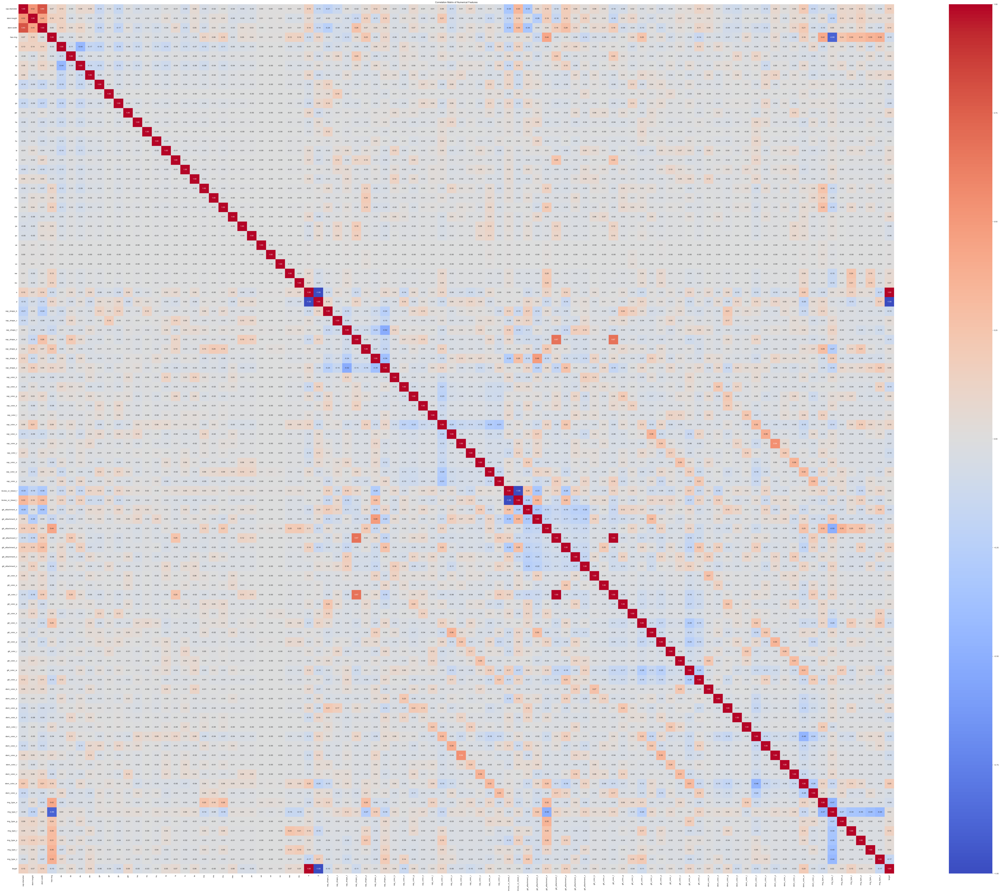

In [64]:
# Calculate the correlation matrix for numerical features
correlation_matrix = df.corr()

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(100, 80))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
plt.title('Correlation Matrix of Numerical Features')
plt.show()

In [65]:
# Dropping columns with high correlation ( e, p, gill_color_f, gill_attachment_f, has_rings, bruise_or_bleed_f
df.drop(['e', 'p', 'gill_color_f', 'gill_attachment_f', 'has-ring', 'bruise_or_bleed_f'], axis=1, inplace=True)

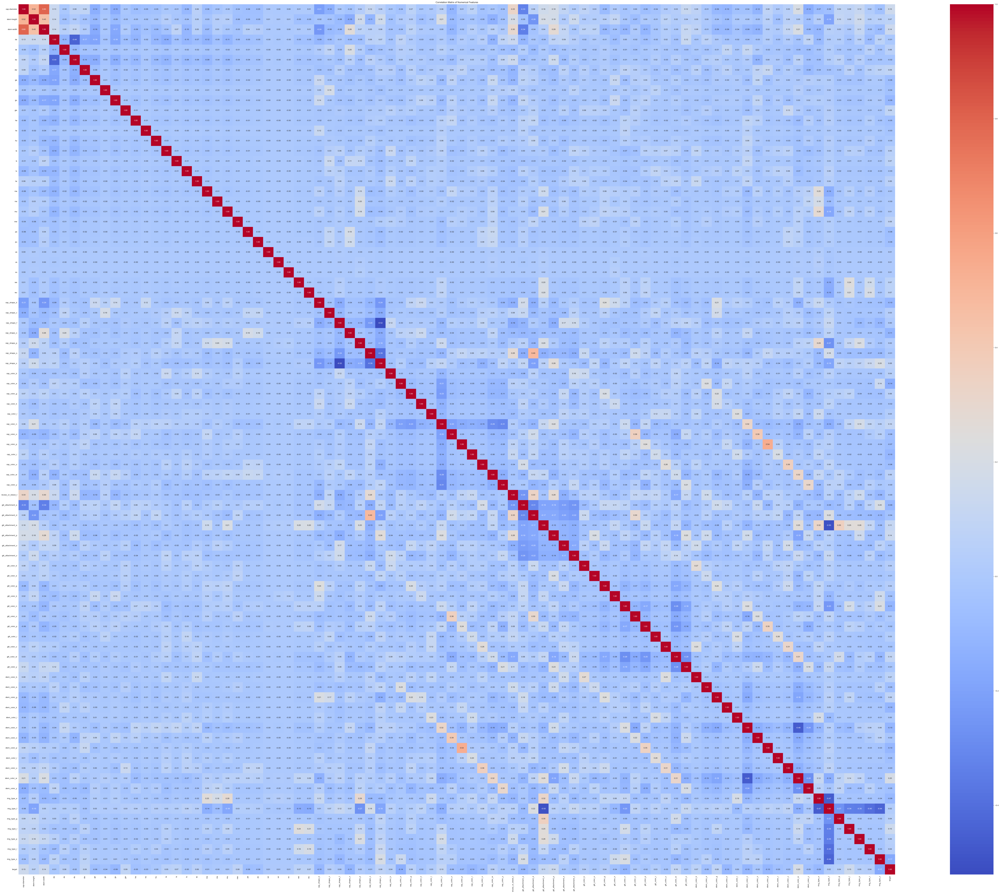

In [66]:
# Calculate the correlation matrix for numerical features
correlation_matrix = df.corr()

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(100, 80))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
plt.title('Correlation Matrix of Numerical Features')
plt.show()

## 3.4 Dimentiionality Reduction

### 3.4.1 Preparing the Data

In [67]:
from sklearn.preprocessing import StandardScaler

# Assuming df is your DataFrame and you've separated features and the target variable
X = df.drop(['target'], axis=1)  # Replace 'target_column' with your actual target column name
y = df['target']  # Your target variable

# Standardizing the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
df

# Column count


,cap-diameter,stem-height,stem-width,da,ds,du,dw,ga,gs,gu,...,stem_color_w,stem_color_y,ring_type_e,ring_type_f,ring_type_g,ring_type_l,ring_type_p,ring_type_r,ring_type_z,target
353,6.87,6.88,13.64,True,False,False,False,False,False,False,...,True,False,False,False,False,False,True,False,False,False
354,8.59,9.15,17.34,True,False,False,False,False,False,False,...,True,False,False,False,False,False,True,False,False,False
355,5.95,7.54,12.73,False,False,True,False,False,False,False,...,True,False,False,False,False,False,True,False,False,False
356,6.51,6.80,12.92,True,False,False,False,False,False,False,...,True,False,False,False,False,False,True,False,False,False
357,7.66,8.55,14.98,True,False,False,False,False,False,False,...,True,False,False,False,False,False,True,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61064,1.18,3.93,6.22,True,False,False,False,False,False,False,...,False,True,False,True,False,False,False,False,False,False
61065,1.27,3.18,5.43,True,False,False,False,False,False,False,...,False,True,False,True,False,False,False,False,False,False
61066,1.27,3.86,6.37,False,False,True,False,False,False,False,...,False,True,False,True,False,False,False,False,False,False
61067,1.24,3.56,5.44,False,False,True,False,False,False,False,...,False,True,False,True,False,False,False,False,False,False


### 3.4.2 Applying Principal Component Analysis (PCA)

In [68]:
from sklearn.decomposition import PCA

# Applying PCA without specifying the number of components to retain all components
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# The explained variance ratio of each principal component
explained_variance_ratio = pca.explained_variance_ratio_

### 3.4.3 Choosing the Number of Components

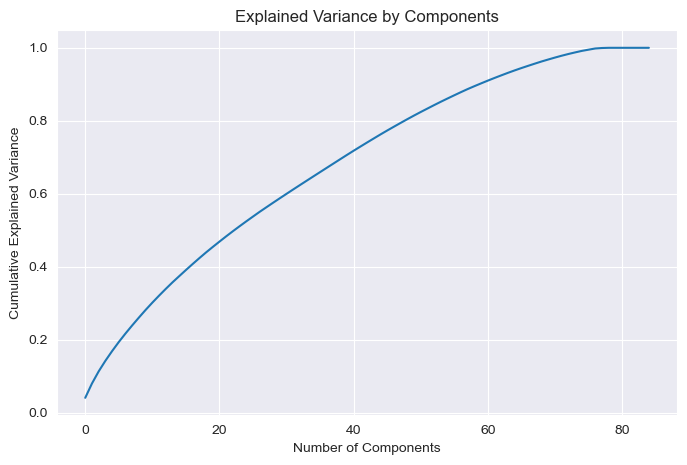

In [69]:
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

plt.figure(figsize=(8, 5))
plt.plot(cumulative_explained_variance)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Components')
plt.grid(True)
plt.show()

In [70]:
# Example: Choosing enough components to explain 95% of the variance
cumulative_variance = np.cumsum(explained_variance_ratio)
n_components_95 = np.where(cumulative_variance >= 0.95)[0][0] + 1  # Adding 1 because indices start at 0

print(f"Number of components to explain 95% variance: {n_components_95}")

# Applying PCA with the chosen number of components
pca_95 = PCA(n_components=n_components_95)
X_pca_95 = pca_95.fit_transform(X_scaled)

Number of components to explain 95% variance: 67


### 3.4.4 Reducing the Dimensionality

In [71]:
# Applying PCA with the chosen number of components
pca_final = PCA(n_components=67)
X_pca_final = pca_final.fit_transform(X_scaled)

# Save the PCA-transformed features to a new DataFrame
pca_df = pd.DataFrame(X_pca_final, columns=[f'PC{i+1}' for i in range(X_pca_final.shape[1])])
pca_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC58,PC59,PC60,PC61,PC62,PC63,PC64,PC65,PC66,PC67
0,4.296227,2.130730,0.736998,-0.903311,-0.402697,-0.832421,-0.040873,0.510911,-0.331327,-0.095939,...,-0.581805,-0.841582,1.135613,0.938425,-0.290135,0.261815,0.210157,0.079773,-0.239706,0.585988
1,5.558586,2.668208,1.672126,-0.470896,0.415408,-0.084777,-0.904100,0.807713,1.297120,-1.368701,...,0.406403,0.089074,0.823364,-0.930560,0.423950,0.219995,0.773795,-1.141438,0.143678,-1.343976
2,4.689759,3.114362,1.819275,-0.725288,0.643138,-0.852580,-1.532401,0.518186,1.402447,-1.062467,...,0.459705,0.021536,0.866923,-0.998806,0.846990,0.358803,0.813921,-1.048909,0.169082,-1.331321
3,4.206472,2.180897,0.722863,-0.924605,-0.394788,-0.853291,-0.032967,0.490894,-0.313395,-0.086990,...,-0.587232,-0.857542,1.127976,0.938946,-0.255564,0.274610,0.209410,0.074503,-0.241935,0.596919
4,4.736673,2.015741,0.722586,-0.767239,-0.448866,-0.713424,-0.041859,0.551623,-0.402660,-0.133069,...,-0.540108,-0.707634,1.123590,0.980137,-0.371316,0.169130,0.203684,0.090027,-0.264153,0.697567
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43473,-1.746053,-0.785538,-0.482212,-1.015376,-1.182154,0.827547,-0.025019,-1.158670,1.101202,-1.295131,...,-0.284828,0.138776,0.350802,-0.560239,-0.175533,-0.250490,0.361006,-0.525679,-0.117315,1.013155
43474,-1.925246,-0.168356,-0.485785,-0.374593,-1.919498,0.587022,0.976468,-1.048836,1.744544,-1.546667,...,-0.163740,-0.218640,0.035679,0.291672,-0.214102,0.483658,0.311499,-0.284982,0.378373,0.842858
43475,-1.808382,-0.704045,-0.261475,-1.060110,-1.027087,0.257910,-0.696318,-1.305497,1.057111,-1.062583,...,-0.174954,0.251910,0.432386,-0.604389,-0.003067,-0.246857,0.401296,-0.391777,-0.095349,1.035346
43476,-1.931420,-0.077748,-0.282572,-0.395483,-1.772689,0.035643,0.310862,-1.201086,1.694130,-1.318353,...,-0.045150,-0.078586,0.106151,0.260953,-0.036593,0.470242,0.349092,-0.153970,0.390886,0.909440


# 4. Model Building

### 4.1.1 Decision Tree Training

In [72]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

# Assuming X_pca_final and y are your features and target variable, respectively
X_train, X_test, y_train, y_test = train_test_split(X_pca_final, y, test_size=0.2, random_state=42)

dt_clf = DecisionTreeClassifier(random_state=42)
dt_clf.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

### 4.1.2 Decision Tree Prediction

In [73]:
from sklearn.metrics import accuracy_score

y_pred_dt = dt_clf.predict(X_test)
print(f"Decision Tree Accuracy: {accuracy_score(y_test, y_pred_dt)}")

Decision Tree Accuracy: 0.9886154553817847


### 4.2.1 K-Means Clustering Training

In [74]:
from sklearn.cluster import KMeans

# Choose an appropriate number of clusters, k
kmeans = KMeans(n_clusters=25, random_state=42)
kmeans.fit(X_scaled)  # Using scaled features, not PCA-transformed for clustering

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans(n_clusters=25, random_state=42)

### 4.2.2 K-Means Clustering Prediction

In [75]:
# Assuming X_scaled is your scaled feature matrix
cluster_labels = kmeans.predict(X_scaled)

# Accuracy calculation for clustering
# Assuming y is your target variable
accuracy = accuracy_score(y, cluster_labels)
print(f"K-Means Clustering Accuracy: {accuracy}")

K-Means Clustering Accuracy: 0.11739270435622613


### 4.3.1 Logistic Regression Training 

In [76]:
from sklearn.linear_model import LogisticRegression

log_reg = LogisticRegression(random_state=42)
log_reg.fit(X_train, y_train)

/opt/homebrew/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=42)

### 4.3.2 Logistic Regression Prediction

In [77]:
y_pred_lr = log_reg.predict(X_test)

# Accuracy
accuracy_score(y_test, y_pred_lr)

0.7287258509659613

### 4.4.1 Random Forest Training

In [78]:
from sklearn.ensemble import RandomForestClassifier

rf_clf = RandomForestClassifier(random_state=42)
rf_clf.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

### 4.4.2 Random Forest Prediction

In [79]:
y_pred_rf = rf_clf.predict(X_test)

# Accuracy
accuracy_score(y_test, y_pred_rf)

0.9971251149954001

#### 4.4.2.1 Saving the model

In [80]:
# Save the random forest model to model/randomForest.pkl
import joblib

joblib.dump(rf_clf, 'Models/randomForest.pkl')
# Save the PCA transformation object
joblib.dump(pca_final, 'Models/pca_transformation.pkl')

['Models/pca_transformation.pkl']